In [1]:
accelerator = 'gpu'
if accelerator == 'tpu':
    !pip install cloud-tpu-client==0.10 torch==1.9.0 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.9-cp37-cp37m-linux_x86_64.whl
    import torch_xla
    import torch_xla.core.xla_model as xm
    import torch_xla.debug.metrics as met
    import torch_xla.distributed.parallel_loader as pl
    import torch_xla.distributed.xla_multiprocessing as xmp
    import torch_xla.utils.utils as xu    
import torch
from torch import nn, optim
from torchvision import transforms, datasets
from torch.optim import Adam
import torch.nn.functional as F   
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as tt
from torchvision.utils import make_grid
from PIL import Image
from tqdm.notebook import tqdm
from IPython.display import clear_output
import warnings
warnings.filterwarnings('ignore')

device = 'cuda' if torch.cuda.is_available() and accelerator == 'gpu' else xm.xla_device()

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!mkdir -p ~/.kaggle
!mkdir /content/cartoon/
!mkdir /content/real/
!cp /content/kaggle.json ~/.kaggle/
!kaggle datasets download -d brendanartley/cartoon-faces-googles-cartoon-set
# !kaggle datasets download -d dullaz/flickrfaces-dataset-nvidia-128x128
# # !kaggle datasets download -d kitaef/41-epochs-faces
!unzip -n /content/cartoon-faces-googles-cartoon-set.zip -d /content/cartoon/
# !unzip -n /content/flickrfaces-dataset-nvidia-128x128.zip
# # !unzip -n /content/41-epochs-faces.zip

!kaggle datasets download -d arnaud58/ffhq-flickr-faces-align-crop-and-segment
!unzip -n /content/ffhq-flickr-faces-align-crop-and-segment.zip -d /content/real/

mkdir: cannot create directory ‘/content/cartoon/’: File exists
mkdir: cannot create directory ‘/content/real/’: File exists
cartoon-faces-googles-cartoon-set.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/cartoon-faces-googles-cartoon-set.zip
ffhq-flickr-faces-align-crop-and-segment.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/ffhq-flickr-faces-align-crop-and-segment.zip


In [4]:
!kaggle datasets download -d arnaud58/ffhq-flickr-faces-align-crop-and-segment
!unzip -n /content/ffhq-flickr-faces-align-crop-and-segment.zip -d /content/real

ffhq-flickr-faces-align-crop-and-segment.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/ffhq-flickr-faces-align-crop-and-segment.zip


In [5]:
class ImageDS(Dataset):
    
    def __init__(self, path_a, path_b, image_size):
        super().__init__()
        self.image_size = image_size
        self.images_a = self.process_folder(path_a, crop='face')
        self.images_b = self.process_folder(path_b, crop='cartoon')
        self.size_a = len(self.images_a)
        self.size_b = len(self.images_b)
        self.bigger = True if self.size_a >= self.size_b else False
        
    def process_folder(self, path, crop):
        images = []
#         file_names = os.listdir(path)
#         if DATASET_SIZE != -1:
#             file_names = file_names[:DATASET_SIZE]
#         for fname in tqdm(file_names):
        progress_bar = tqdm(total=DATASET_SIZE, desc='Images processed:', position=0)      
        for dirname, _, filenames in os.walk(path):
            if len(images) >= DATASET_SIZE:
                    break
            for filename in filenames:
                if len(images) >= DATASET_SIZE:
                    break
                if filename.endswith('.jpg') or filename.endswith('.png'):
            #                 f_path = path + fname
            #                 image = Image.open(f_path)
            #                 if image.getbands() == ('R', 'G', 'B'):
                    image = Image.open(os.path.join(dirname, filename))
                    progress_bar.update(1)
                    scale = 1.4 if crop == 'cartoon' else 1.0
                    transform = tt.Compose([
                            tt.Resize(int(self.image_size * scale)),
                            tt.CenterCrop(self.image_size),
                            tt.RandomHorizontalFlip(),
                            tt.ToTensor(),
                            tt.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
                    image = transform(image)
                    images.append(image)
                    
#                     clear_output()
#                     print(len(images), '/', DATASET_SIZE, sep='')
                    if len(images) >= DATASET_SIZE:
                        break
                
        return images
        
    
    def __len__(self):
        return self.size_a if self.bigger else self.size_b
    
    def __getitem__(self, index):
        if self.bigger:
            image_a = self.images_a[index]
            image_b = self.images_b[int(index * (self.size_b / self.size_a))]
        else:
            image_a =  self.images_a[int(index * (self.size_a / self.size_b))]
            image_b =  self.images_b[index]
            
        return image_a, image_b
# # Apples2oranges
# path_tr_a = '../input/apple2orange-dataset/trainA/'
# path_tr_b ='../input/apple2orange-dataset/trainB/'
# path_tst_a = '../input/apple2orange-dataset/testA/'
# path_tst_b = '../input/apple2orange-dataset/testB/'

# # Monet2photo
# path_tr_a = '../input/monet2photo/trainA/'
# path_tr_b ='../input/monet2photo/trainB/'
# path_tst_a = '../input/monet2photo/testA/'
# path_tst_b = '../input/monet2photo/testB/'

# cars2toys
# path_tr_a = '../input/stanford-cars-dataset/cars_train/cars_train/'
# path_tr_b = '../input/toy-cars-annotated-on-yolo-format/'

# faces2cartoons
# path_tr_a = '../input/flickrfaces-dataset-nvidia-128x128/real_faces_128'
# path_tr_b = '../input/cartoon-faces-googles-cartoon-set/'
path_tr_a = '/content/real'
path_tr_b = '/content/cartoon'


IMAGE_SIZE = 64
BATCH_SIZE = 100
DATASET_SIZE = 12500

faces_ds = ImageDS(path_tr_a, path_tr_b, IMAGE_SIZE)
# test_ds = ImageDS(path_tst_a, path_tst_b, IMAGE_SIZE)
from sklearn.model_selection import train_test_split
train_ds, test_ds = train_test_split(faces_ds, test_size=0.2, random_state=1)

train_dl = DataLoader(train_ds, BATCH_SIZE, shuffle=True, num_workers=8, pin_memory=True)
test_dl = DataLoader(test_ds, BATCH_SIZE, shuffle=True, num_workers=8, pin_memory=True)

Images processed::   0%|          | 0/12500 [00:00<?, ?it/s]

Images processed::   0%|          | 0/12500 [00:00<?, ?it/s]

In [6]:
# import pickle
# with open('train_dataset', 'wb') as file:
#     pickle.dump(train_ds, file)
# with open('../input/faces-after-40-epochs/train_dataset', 'rb') as file:
#     train_ds = pickle.load(file)
# train_dl = DataLoader(train_ds, BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)

torch.Size([100, 3, 64, 64]) torch.Size([100, 3, 64, 64]) torch.Size([100, 3, 64, 64])


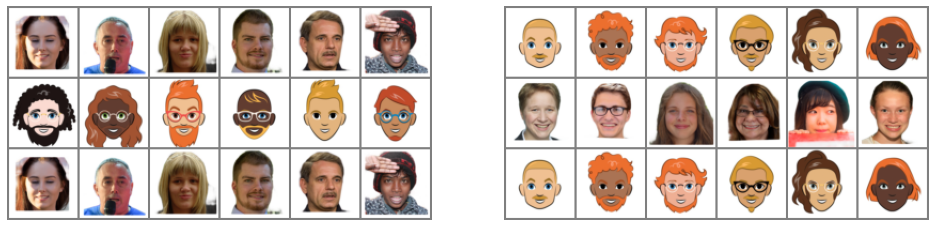

In [7]:
def denorm(img_tensors):
    return img_tensors * 0.5 + 0.5

def show(a_real, a_trans, a_recov,
         b_real, b_trans, b_recov, 
         grid,
         rows=4):
    plt.subplot(grid[0:rows, 0:1])
        
    plt.imshow(denorm(make_grid(torch.cat((a_real[:rows].detach().cpu(),
                                 a_trans[:rows].detach().cpu(),
                                 a_recov[:rows].detach().cpu()), dim=0), nrow=rows
                            ).permute(1,2,0)
                  )
            )
    plt.axis('off')
    plt.subplot(grid[0:rows, 1:2])
    plt.imshow(denorm(make_grid(torch.cat((b_real[:rows].detach().cpu(),
                                        b_trans[:rows].detach().cpu(),
                                        b_recov[:rows].detach().cpu()), dim=0), nrow=rows
                            ).permute(1,2,0)
                  )
            )
    plt.axis('off')
    
    # for i in range(1, rows+1):
    #     plt.subplot(grid[i-1:i, 0:1])
        
    #     plt.imshow(denorm(make_grid([a_real[i-1].detach().cpu(),
    #                                         a_trans[i-1].detach().cpu(),
    #                                         a_recov[i-1].detach().cpu()], nrow=3
    #                             ).permute(1,2,0)
    #                   )
    #             )
    #     plt.axis('off')
    #     plt.subplot(grid[i-1:i, 1:2])
    #     plt.imshow(denorm(make_grid([b_real[i-1].detach().cpu(),
    #                                         b_trans[i-1].detach().cpu(),
    #                                         b_recov[i-1].detach().cpu()], nrow=3
    #                             ).permute(1,2,0)
    #                   )
    #             )
    #     plt.axis('off')

a_real, a_trans = next(iter(train_dl))
a_recov = a_real
b_trans, b_real = next(iter(train_dl))
b_recov = b_real
print(a_real.shape, a_trans.shape, a_recov.shape)
rows = 6
plt.figure(figsize=(17, rows*1.2))
grid = plt.GridSpec(rows+5, 2, wspace = .1, hspace = .01)
show(a_real, a_trans, a_recov, b_real, b_trans, b_recov, grid, rows)

In [92]:
def conv_block(in_ch, out_ch, kernel=3, stride=2, padding=1, normalize=True, activation=nn.LeakyReLU(0.2, inplace=True)):
    layers = [nn.ReflectionPad2d(padding)] if padding > 0 else []
    layers += [nn.Conv2d(in_ch, out_ch, kernel_size=kernel, stride=stride, padding=0)]
    if normalize:
        layers += [nn.BatchNorm2d(out_ch, affine=True) if BATCH_SIZE > 1 else nn.InstanceNorm2d(out_ch, affine=True)]
    if activation:
        layers += [activation]
    return layers

def deconv_block(in_ch, out_ch,
                 kernel=3, stride=1, padding=1,
                 normalize=True,
                 activation=True):
    layers = [nn.Upsample(scale_factor = 2, mode='bilinear'),
              nn.ReflectionPad2d(padding),
              nn.Conv2d(in_ch, out_ch, kernel_size=kernel, stride=stride, padding=0)]
    if normalize:
        layers += [nn.BatchNorm2d(out_ch, affine=True) if BATCH_SIZE > 1 else nn.InstanceNorm2d(out_ch, affine=True)]
    if activation:
        layers += [nn.ReLU(inplace=True)]
    return layers
    
class Res_block(nn.Module):
    
    def __init__(self, in_ch):
        super().__init__()
        self.block = nn.Sequential(nn.ReflectionPad2d(1),
                                   nn.Conv2d(in_ch, in_ch, kernel_size=3),
                                   nn.BatchNorm2d(in_ch, affine=True) if BATCH_SIZE > 1 else nn.InstanceNorm2d(in_ch, affine=True),
                                   nn.ReLU(inplace=True),
#                                    nn.ReflectionPad2d(1),
#                                    nn.Conv2d(in_ch, in_ch, kernel_size=3),
#                                    nn.BatchNorm2d(in_ch, affine=True) if BATCH_SIZE > 1 else nn.InstanceNorm2d(in_ch, affine=True)
                                  )
    def forward(self, x):
        return x + self.block(x)
    
    
class Discriminator(nn.Module):
    
    def __init__(self, in_ch=3, features=[64, 128, 256]):
        super().__init__()
        layers = []
        for out_ch in features:
            layers += conv_block(in_ch, out_ch, kernel=3)
            in_ch = out_ch
        layers += conv_block(features[-1], 1, kernel=8, stride=1, padding=0, normalize=False, activation=nn.Sigmoid())
        self.conv = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.conv(x).view(-1, 1)
    
class Generator(nn.Module):
    
    def __init__(self):
        super().__init__()
        layers = []
        layers += conv_block(3, 32, kernel=5, stride=1, padding=2, activation=nn.ReLU(inplace=True))
        layers += conv_block(32,64, activation=nn.ReLU(inplace=True))
        layers += conv_block(64,128, activation=nn.ReLU(inplace=True))
        layers += conv_block(128,256, activation=nn.ReLU(inplace=True))
        layers += conv_block(256,512, activation=nn.ReLU(inplace=True))
        # layers += conv_block(512,512, activation=nn.ReLU(inplace=True))
        # layers += conv_block(1024, 1024, kernel=2, stride=1, padding=0, normalize=False, activation=nn.Sigmoid())
        layers += [Res_block(512)] * 1
        # layers += deconv_block(1024, 1024, activation=nn.ReLU(inplace=True))
        # layers += deconv_block(512, 512, activation=nn.ReLU(inplace=True))
        layers += deconv_block(512, 256, activation=nn.ReLU(inplace=True))
        layers += deconv_block(256, 128, activation=nn.ReLU(inplace=True))
        layers += deconv_block(128, 64, activation=nn.ReLU(inplace=True))
        layers += deconv_block(64, 32, activation=nn.ReLU(inplace=True))
        layers += conv_block(32, 3, kernel=5, stride=1, padding=2, normalize=False, activation=nn.Tanh())
        self.net = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.net(x)
        
def test():
    D = Discriminator()
    G = Generator()
    test = torch.randn(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE)
    print('Disriminator - OK' if D(test).shape == torch.Size([BATCH_SIZE, 1]) else f'Disriminator - failed: {D(test).shape}')
    print('Generator - OK' if G(test).shape == torch.Size([BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE]) else f'Disriminator - failed: {G(test).shape}')
    
test()


Disriminator - OK
Generator - OK


In [119]:
import itertools
import random

class DecayLR:
    def __init__(self, epochs, offset, decay_epochs):
        epoch_flag = epochs - decay_epochs
        assert (epoch_flag > 0), "Decay must start before the training session ends!"
        self.epochs = epochs
        self.offset = offset
        self.decay_epochs = decay_epochs

    def step(self, epoch):
        return 1.0 - max(0, epoch + self.offset - self.decay_epochs) / (
                self.epochs - self.decay_epochs)
    
class ReplayBuffer:
    def __init__(self, max_size=50):
        assert (max_size > 0), "Empty buffer or trying to create a black hole. Be careful."
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)


# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)


# create model
G_A2B = Generator()
G_B2A = Generator()
D_A = Discriminator()
D_B = Discriminator()

G_A2B.apply(weights_init)
G_B2A.apply(weights_init)
D_A.apply(weights_init)
D_B.apply(weights_init)

# G_A2B.load_state_dict(torch.load('/content/drive/MyDrive/DLS FINAL/11_02/10_G_A2B'))
# G_B2A.load_state_dict(torch.load('/content/drive/MyDrive/DLS FINAL/11_02/10_G_B2A'))
# D_A.load_state_dict(torch.load('/content/drive/MyDrive/DLS FINAL/11_02/10_D_A'))
# D_B.load_state_dict(torch.load('/content/drive/MyDrive/DLS FINAL/11_02/10_D_B'))

G_A2B.to(device)
G_B2A.to(device)
D_A.to(device)
D_B.to(device)
None

In [120]:
# a_real, b_real = next(iter(train_dl))
# a_trans = G_A2B(a_real.to(device))
# b_trans = G_B2A(b_real.to(device))
# a_recov = G_B2A(a_trans).detach().cpu()
# b_recov = G_A2B(b_trans).detach().cpu()
# rows = 6
# plt.figure(figsize=(17, rows*1))
# grid = plt.GridSpec(rows, 2, wspace = .1, hspace = .01)
# show(a_real, a_trans.detach().cpu(), a_recov, b_real, b_trans.detach().cpu(), b_recov, grid, rows)

In [121]:
def pretty_size(size):
	"""Pretty prints a torch.Size object"""
	assert(isinstance(size, torch.Size))
	return " × ".join(map(str, size))

def dump_tensors(gpu_only=True):
  """Prints a list of the Tensors being tracked by the garbage collector."""
  import gc
  total_size = 0
  for obj in gc.get_objects():
    try:
      if torch.is_tensor(obj):
        if not gpu_only or obj.is_cuda:
          print("%s:%s%s %s" % (type(obj).__name__, 
										  " GPU" if obj.is_cuda else "",
										  " pinned" if obj.is_pinned else "",
										  pretty_size(obj.size())))
          total_size += obj.numel()
          del obj
          gc.collect()
          torch.cuda.empty_cache()
      elif hasattr(obj, "data") and torch.is_tensor(obj.data):
        if not gpu_only or obj.is_cuda:
          print("%s → %s:%s%s%s%s %s" % (type(obj).__name__, 
                            type(obj.data).__name__, 
                            " GPU" if obj.is_cuda else "",
                            " pinned" if obj.data.is_pinned else "",
                            " grad" if obj.requires_grad else "", 
                            " volatile" if obj.volatile else "",
                            pretty_size(obj.data.size())))
          total_size += obj.data.numel()
          del obj
          gc.collect()
          torch.cuda.empty_cache()
    except Exception as e:
      pass        
  print("Total size:", total_size)
 
# dump_tensors()
# del D_A
# del D_B
# del G_A2B
# del G_B2A
# gc.collect()
# torch.cuda.empty_cache()

In [122]:
# define loss function (adversarial_loss) and optimizer
cycle_loss = torch.nn.L1Loss().to(device)
identity_loss = torch.nn.L1Loss().to(device)
adversarial_loss = torch.nn.MSELoss().to(device)
lr=0.01
epochs=5
decay_epochs = 0
# Optimizers
optim_G_A2B = torch.optim.Adam(G_A2B.parameters(), lr=lr, betas=(0.5, 0.999))
optim_G_B2A = torch.optim.Adam(G_B2A.parameters(), lr=lr, betas=(0.5, 0.999))
optim_D_A = torch.optim.Adam(D_A.parameters(), lr=lr, betas=(0.5, 0.999))
optim_D_B = torch.optim.Adam(D_B.parameters(), lr=lr, betas=(0.5, 0.999))

# lr_lambda = DecayLR(epochs, 0, decay_epochs).step
# lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(optim_G, lr_lambda=lr_lambda)
# lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(optim_D_A, lr_lambda=lr_lambda)
# lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(optim_D_B, lr_lambda=lr_lambda)
# scheduler_G = torch.optim.lr_scheduler.StepLR(optimizer_G, step_size=7, gamma=0.8)
# scheduler_DA = torch.optim.lr_scheduler.StepLR(optimizer_D_A, step_size=7, gamma=0.8)
# scheduler_DB = torch.optim.lr_scheduler.StepLR(optimizer_D_B, step_size=7, gamma=0.8)

logging_step = len(train_dl)/10
saving_step = len(train_dl)/2

fake_A_buffer = ReplayBuffer()
fake_B_buffer = ReplayBuffer()

losses_D_A = []
losses_D_B = []
losses_G_A2B = []
losses_G_B2A = []

In [123]:
def train(epoch_start=0, epoch_end=5):
    epochs = epoch_end
    

    for epoch in range(epoch_start, epoch_end):
        progress_bar = tqdm(enumerate(train_dl), total=len(train_dl))
        for i, data in progress_bar:
            G_A2B.train()
            G_B2A.train()
            D_A.train()
            D_B.train()
            real_a = data[0].to(device)
            real_b = data[1].to(device)
            batch_size = real_a.size(0)
            # real data label is 1, fake data label is 0.
            real_label = torch.full((batch_size, 1), 1, device=device, dtype=torch.float32).uniform_(0.8, 1.0)
            fake_label = torch.full((batch_size, 1), 0, device=device, dtype=torch.float32).uniform_(0., 0.2)
            
            #### training Generators A2B and B2A:
            optim_G_A2B.zero_grad()
            optim_G_B2A.zero_grad()
            # Identity loss
            # G_B2A(A) should equal A if real A is fed
            transformed_a2a = G_B2A(real_a)
            loss_identity_a = identity_loss(transformed_a2a, real_a) * 1
            # G_A2B(B) should equal B if real B is fed
            transformed_b2b = G_A2B(real_b)
            loss_identity_b = identity_loss(transformed_b2b, real_b) * 1
            # GAN loss D_A(G_A(A))
            fake_a = G_B2A(real_b)
            fake_a_pred = D_A(fake_a)
            loss_GAN_B2A = adversarial_loss(fake_a_pred, real_label)
            # GAN loss D_B(G_B(B))
            fake_b = G_A2B(real_a)
            fake_b_pred = D_B(fake_b)
            loss_GAN_A2B = adversarial_loss(fake_b_pred, real_label)
            # Cycle loss
            recovered_b2a = G_B2A(fake_b)
            loss_cycle_ABA = cycle_loss(recovered_b2a, real_a) * 3
            recovered_a2b = G_A2B(fake_a)
            loss_cycle_BAB = cycle_loss(recovered_a2b, real_b) * 3
            # Combine loss and calculate gradients
            loss_G_A2B = loss_GAN_A2B + loss_cycle_BAB + loss_identity_b
            loss_G_B2A = loss_GAN_B2A + loss_cycle_ABA + loss_identity_a
            if (i+1)%logging_step==0:
                losses_G_A2B.append(loss_G_A2B.item())
                losses_G_B2A.append(loss_G_B2A.item())
            # Update G_A and G_B's weights
            loss_G_A2B.backward(retain_graph=True)
            loss_G_B2A.backward()
            optim_G_A2B.step()
            optim_G_B2A.step()
            if accelerator == 'tpu':  # for training on 1-core of TPU
                xm.mark_step()
            
            #### training Discriminator A
            optim_D_A.zero_grad()
            # Real A image loss
            real_a_pred = D_A(real_a)
            loss_D_real_a = adversarial_loss(real_a_pred, real_label)
            # Fake A image loss
            fake_a = fake_A_buffer.push_and_pop(fake_a)
            fake_a_pred = D_A(fake_a.detach())
            loss_D_fake_a = adversarial_loss(fake_a_pred, fake_label)
            # Combined loss and calculate gradients
            loss_D_A = (loss_D_real_a + loss_D_fake_a)
            if (i+1)%logging_step==0:
                losses_D_A.append(loss_D_A.item())
            # Calculate gradients for D_A
            loss_D_A.backward()
            # Update D_A weights
            optim_D_A.step()
            if accelerator == 'tpu':
                xm.mark_step()
            
            #### training Discriminator B
            optim_D_B.zero_grad()
            # Real B image loss
            real_b_pred = D_B(real_b)
            loss_D_real_b = adversarial_loss(real_b_pred, real_label)
            # Fake B image loss
            fake_b = fake_B_buffer.push_and_pop(fake_b)
            fake_b_pred = D_B(fake_b.detach())
            loss_D_fake_b = adversarial_loss(fake_b_pred, fake_label)
            # Combined loss and calculate gradients
            loss_D_B = (loss_D_real_b + loss_D_fake_b)
            if (i+1)% logging_step==0:
                losses_D_B.append(loss_D_B.item())
            # Calculate gradients for D_B
            loss_D_B.backward()
            # Update D_B weights
            optim_D_B.step()
            if accelerator == 'tpu':
                xm.mark_step()
                
            progress_bar.set_description(
                f"[{epoch+1}/{epochs}][{i+1}/{len(train_dl)}] "
                f"Loss_D_A: {(loss_D_A).item():.4f} "
                f"Loss_D_B: {(loss_D_B).item():.4f} "
                f"Loss_G_A2B: {loss_G_A2B.item():.4f} "
                f"Loss_G_B2A: {loss_G_B2A.item():.4f} "
                f"Loss_G_identity: {(loss_identity_a + loss_identity_b).item():.4f} "
                f"loss_G_GAN: {(loss_GAN_A2B + loss_GAN_B2A).item():.4f} "
                f"loss_G_cycle: {(loss_cycle_ABA + loss_cycle_BAB).item():.4f}")
    #     clear_output()
            # save models
            if (i+1) % saving_step == 0:
                model_path = f'./new_{epoch+1}_{i + 1}_'
                torch.save(G_A2B.cpu().state_dict(), model_path + 'G_A2B')
                torch.save(G_B2A.cpu().state_dict(), model_path + 'G_B2A')
                torch.save(D_A.cpu().state_dict(), model_path + 'D_A')
                torch.save(D_B.cpu().state_dict(), model_path + 'D_B')
                G_A2B.to(device)
                G_B2A.to(device)
                D_A.to(device)
                D_B.to(device)

            # show results
            if (i + 1) % logging_step == 0:
                G_A2B.eval()
                G_B2A.eval()
                D_A.eval()
                D_B.eval()
                test_iter = iter(train_dl)
                rows = 5
                a_real, b_real = next(test_iter)
                if BATCH_SIZE < 4:
                    for _ in range(rows-1):
                        next_a, next_b = next(test_iter)
                        a_real = torch.vstack((a_real, next_a))
                        b_real = torch.vstack((b_real, next_b))
                a_real.to(device)
                b_real.to(device)
                plt.figure(figsize=(18,rows+3))
                grid = plt.GridSpec(rows+5, 3, wspace = .1, hspace = .01)
                with torch.no_grad():
                    a_transformed = G_A2B(a_real.to(device))
                    b_transformed = G_B2A(b_real.to(device))
                    a_recovered = G_B2A(a_transformed)
                    b_recovered = G_A2B(b_transformed)
                show(a_real, a_transformed, a_recovered,
                    b_real, b_transformed, b_recovered,
                    grid, rows=rows)
                plt.subplot(grid[rows:rows+5, 0:3])
                plt.plot(losses_G_A2B, label="G_A2B")
                plt.plot(losses_G_B2A, label="G_B2A")
                plt.plot(losses_D_A, label="D_A")
                plt.plot(losses_D_B, label="D_B")
                plt.legend()
                plt.suptitle(t=(
                                f"Batch {i+1}/{len(train_dl)}\n"
                                f"[{epoch+1}/{epochs}][{i+1}/{len(train_dl)}]\n"
                                f"Loss_D_A: {(loss_D_A).item():.4f}\n"
                                f"Loss_D_B: {(loss_D_B).item():.4f}\n"
                                f"Loss_G_A2B: {loss_G_A2B.item():.4f}\n"
                                f"Loss_G_B2A: {loss_G_B2A.item():.4f}\n"
                                f"Loss_G_identity: {(loss_identity_a + loss_identity_b).item():.4f}\n"
                                f"loss_G_GAN: {(loss_GAN_A2B + loss_GAN_B2A).item():.4f}\n"
                                f"loss_G_cycle: {(loss_cycle_ABA + loss_cycle_BAB).item():.4f}"
                                ), y=0.8, x=0.85
                             )
                plt.show()    
        # Update learning rates
    #     lr_scheduler_G.step()
    #     lr_scheduler_D_A.step()
    #     lr_scheduler_D_B.step()


print(f'logging step: {logging_step}')
print(f'saving step: {saving_step}')

logging step: 10.0
saving step: 50.0


In [124]:
# del D_A
# del D_B
# del G_A2B
# del G_B2A
# gc.collect()
# torch.cuda.empty_cache()

  0%|          | 0/100 [00:00<?, ?it/s]

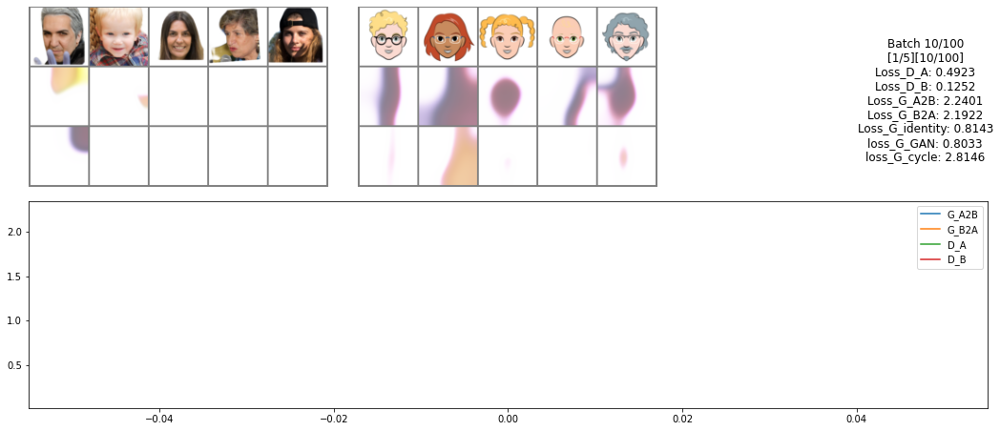

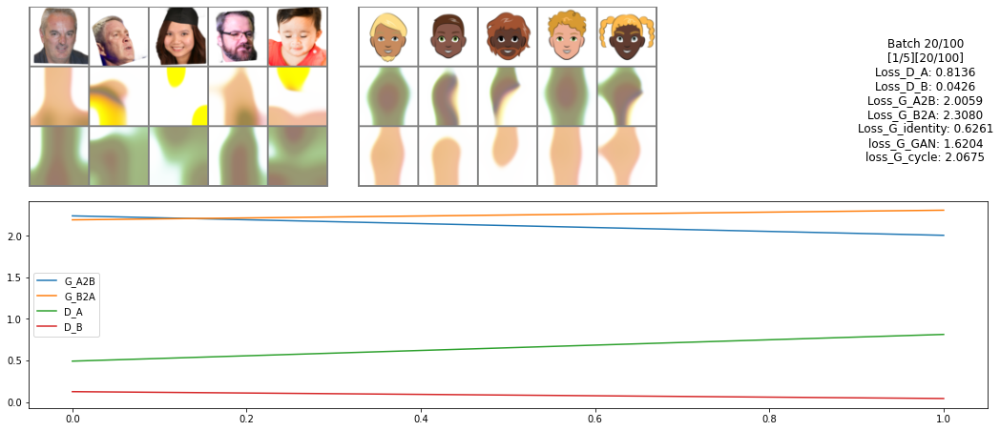

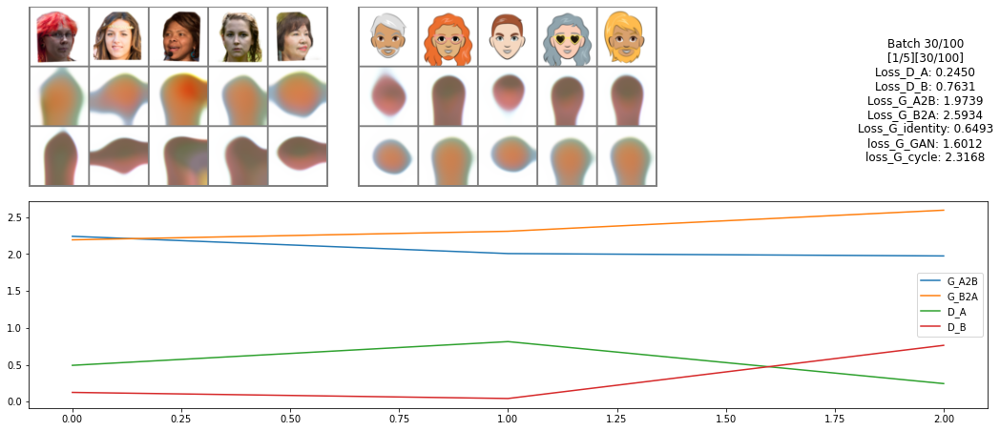

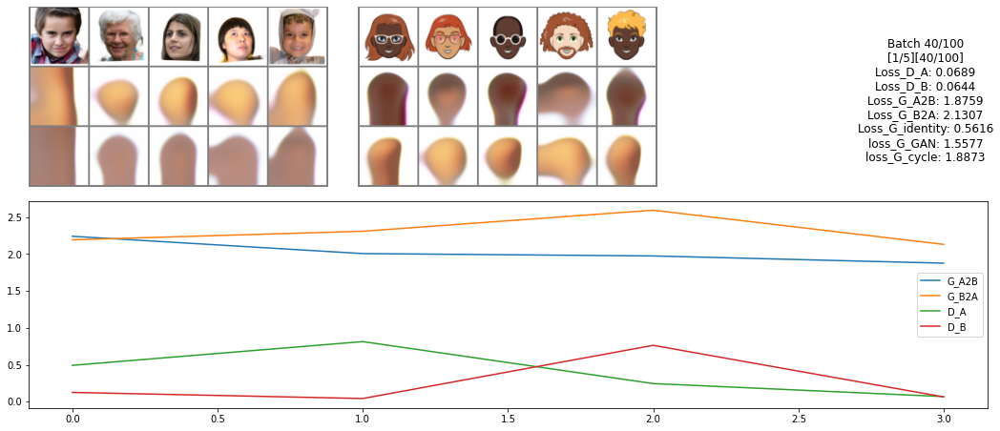

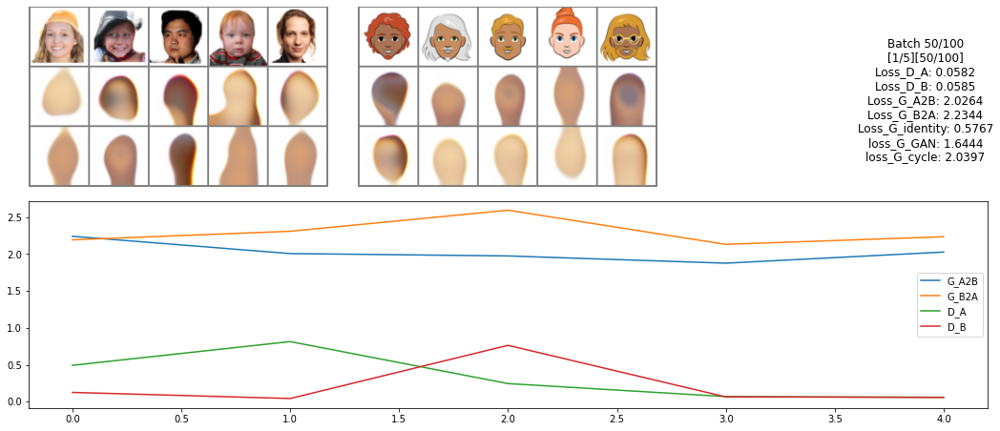

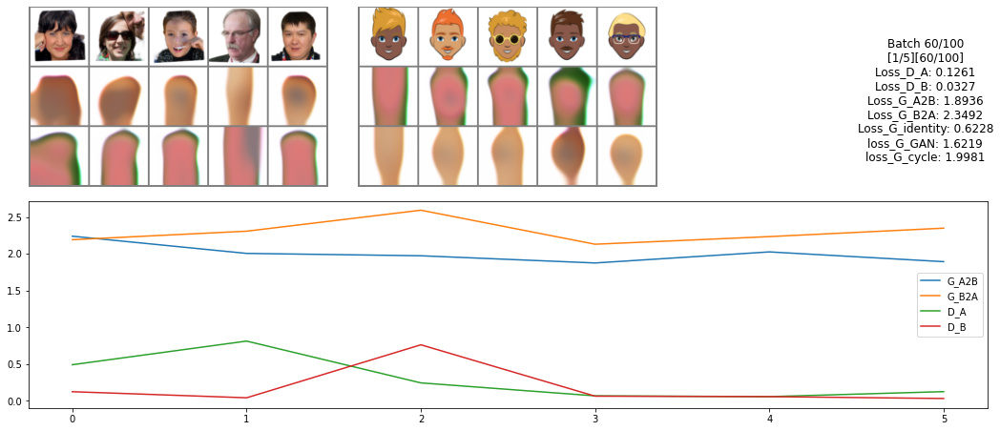

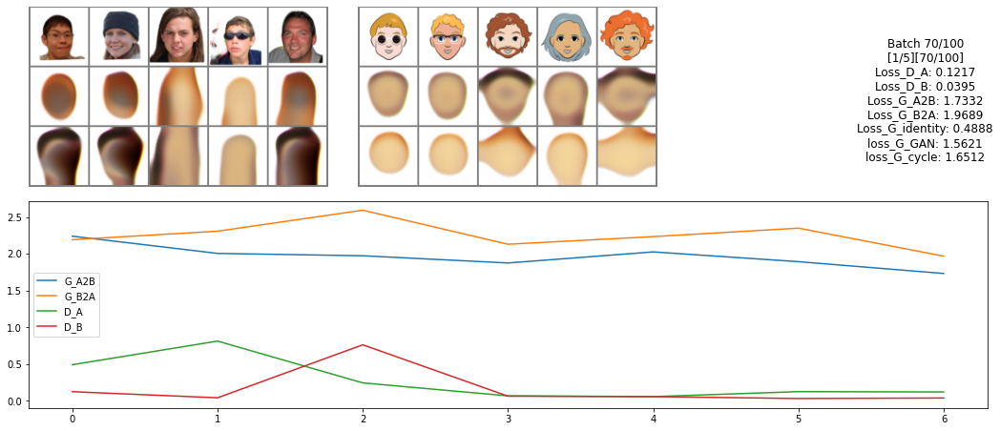

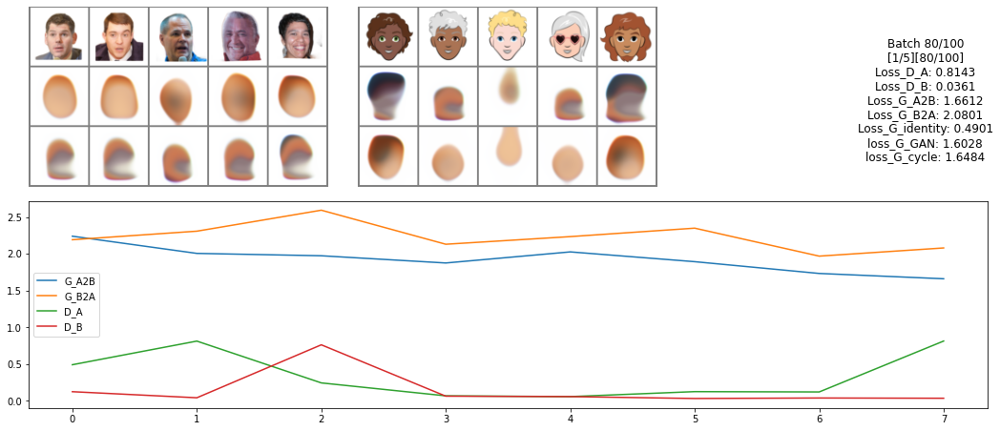

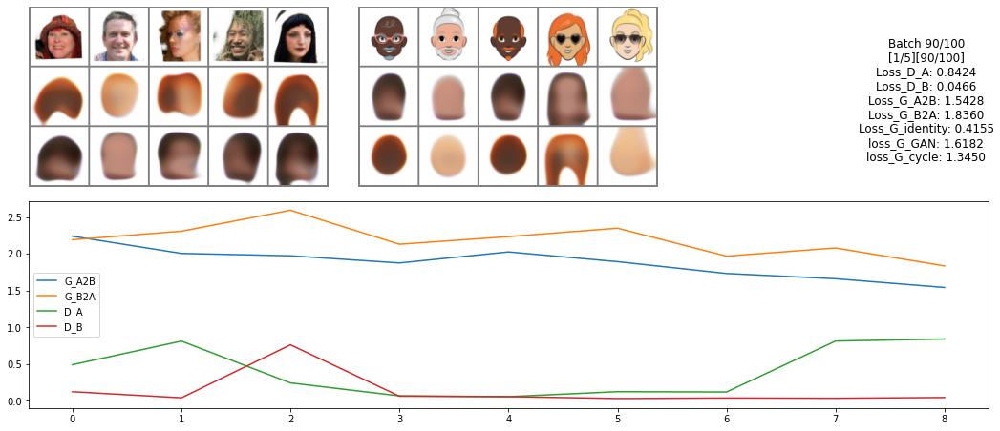

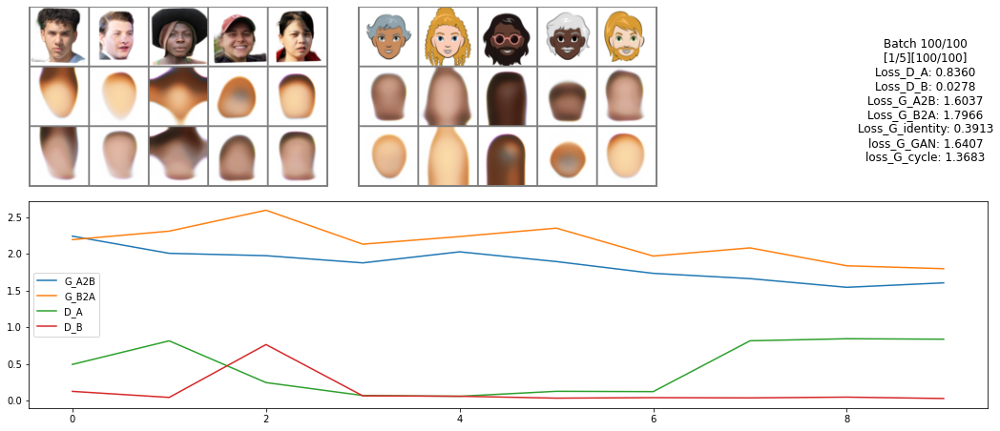

  0%|          | 0/100 [00:00<?, ?it/s]

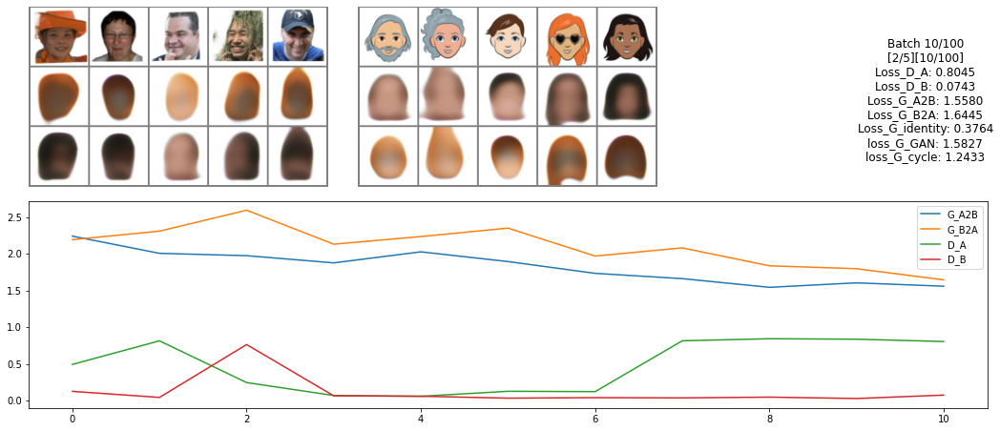

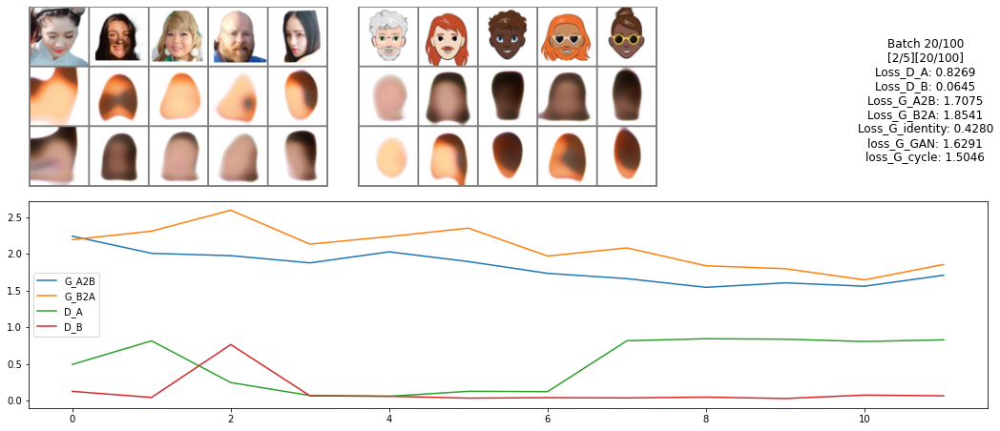

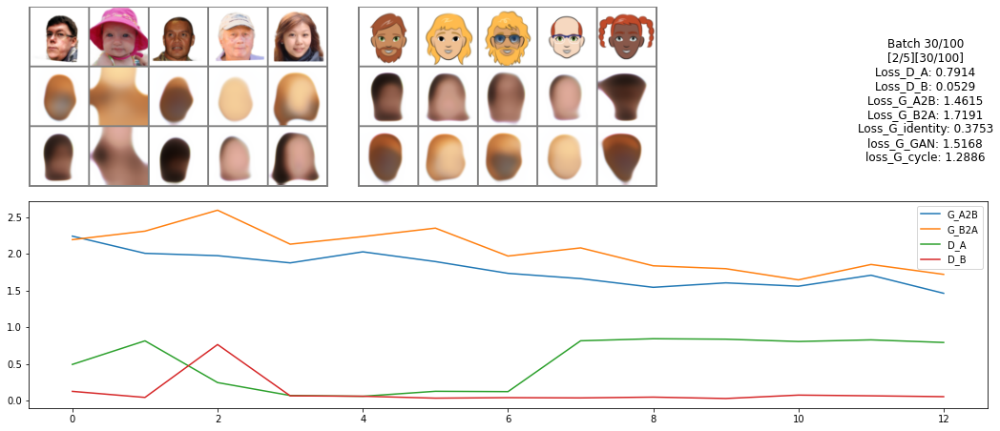

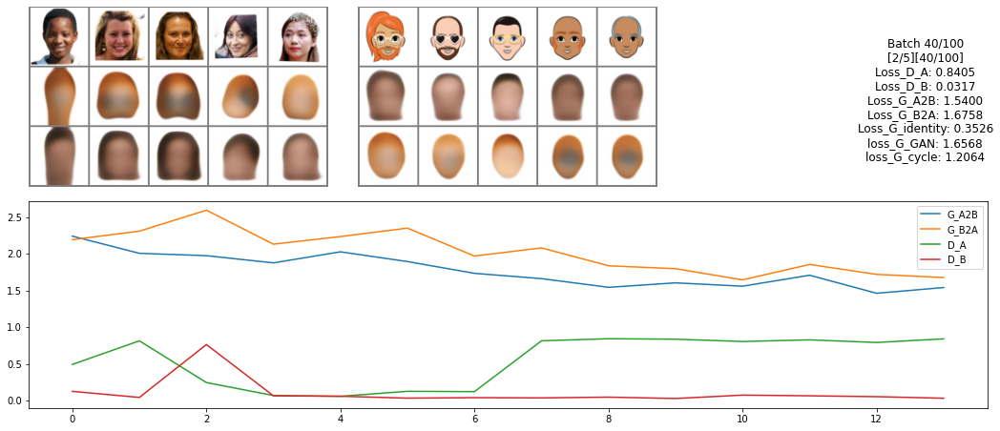

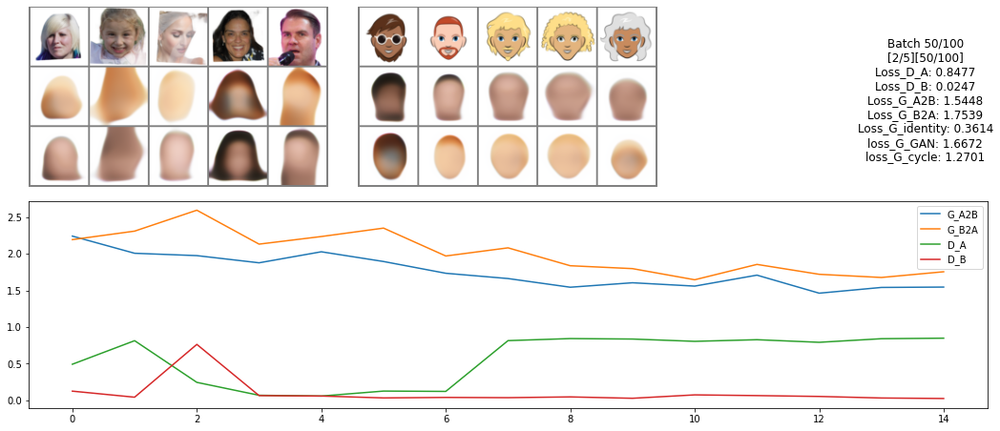

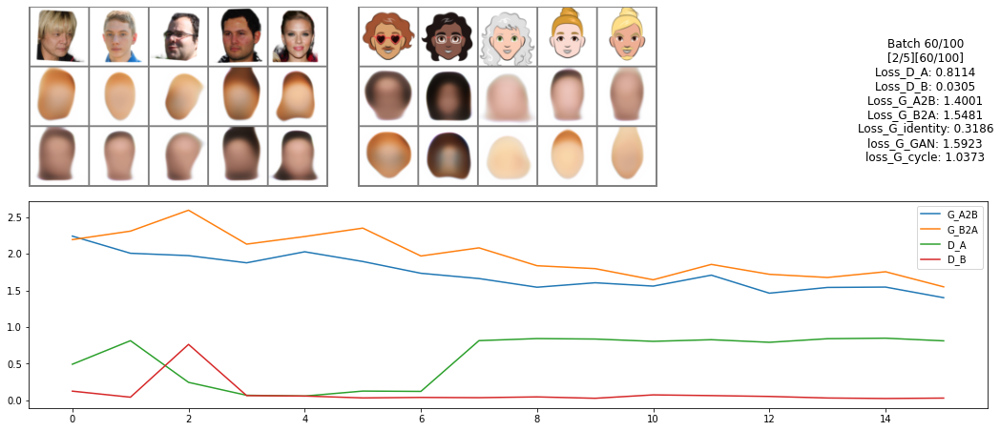

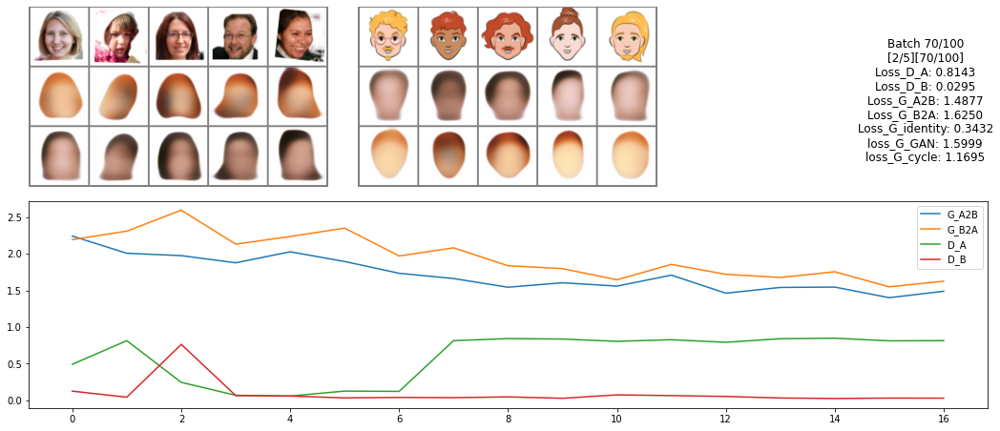

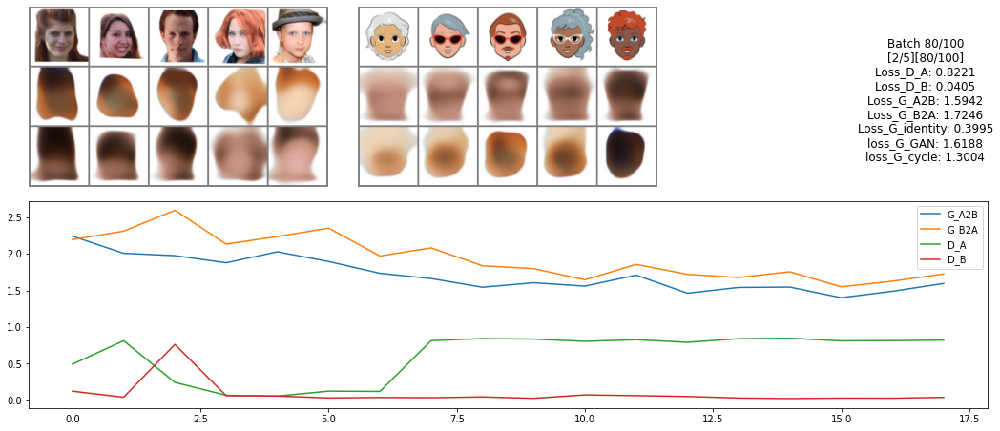

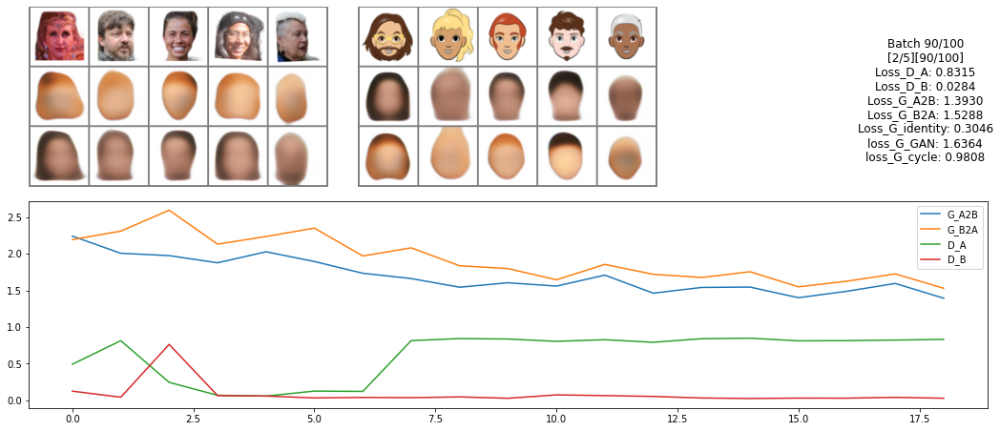

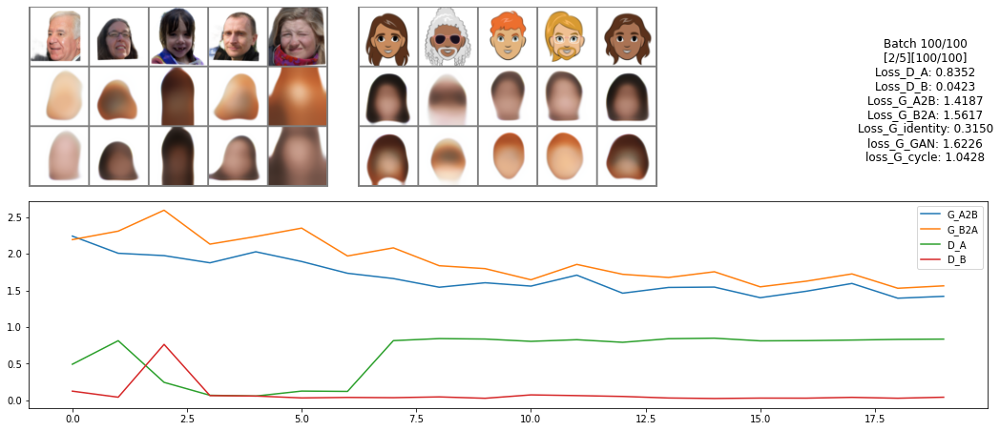

  0%|          | 0/100 [00:00<?, ?it/s]

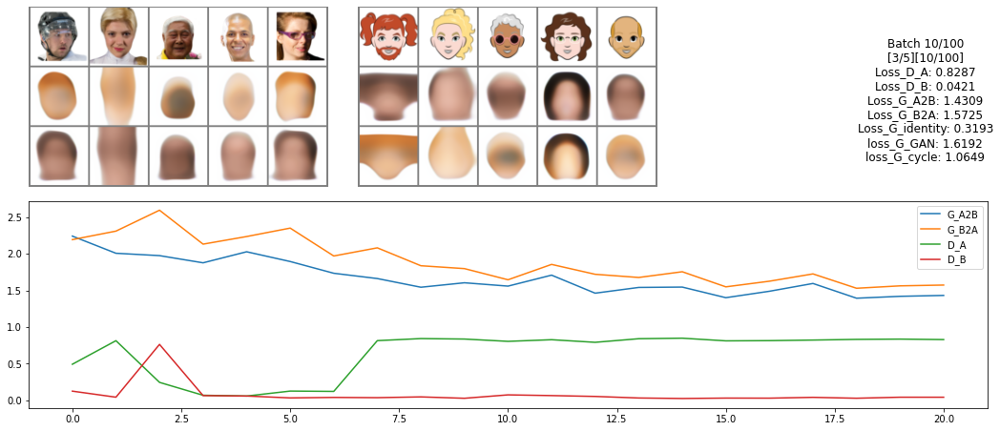

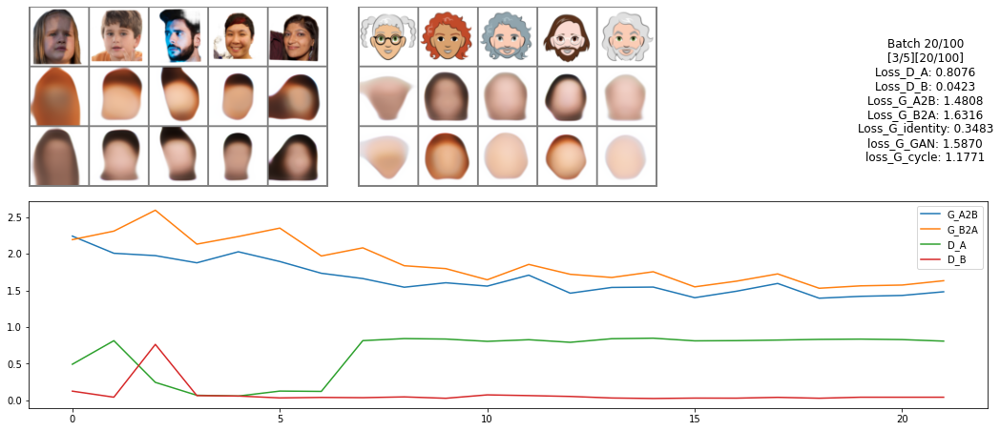

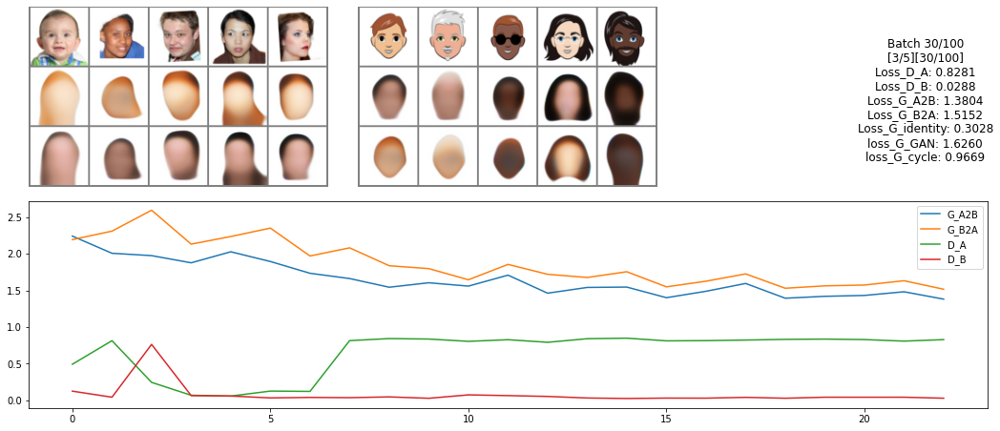

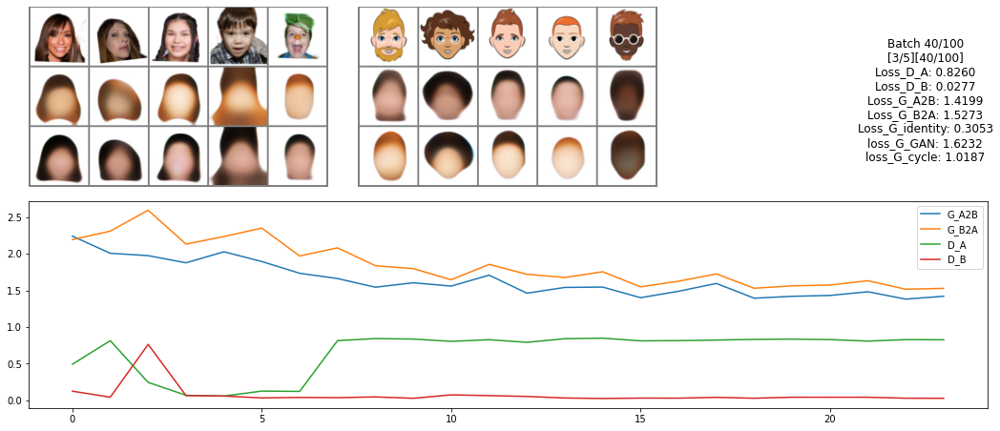

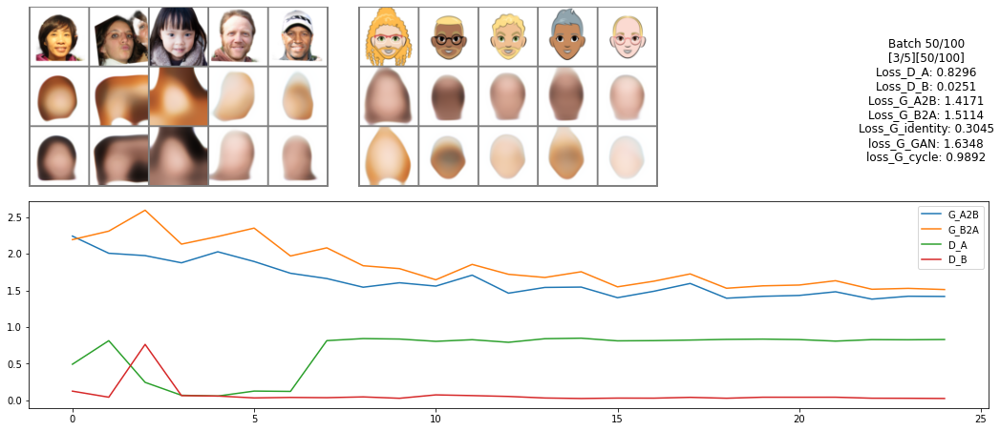

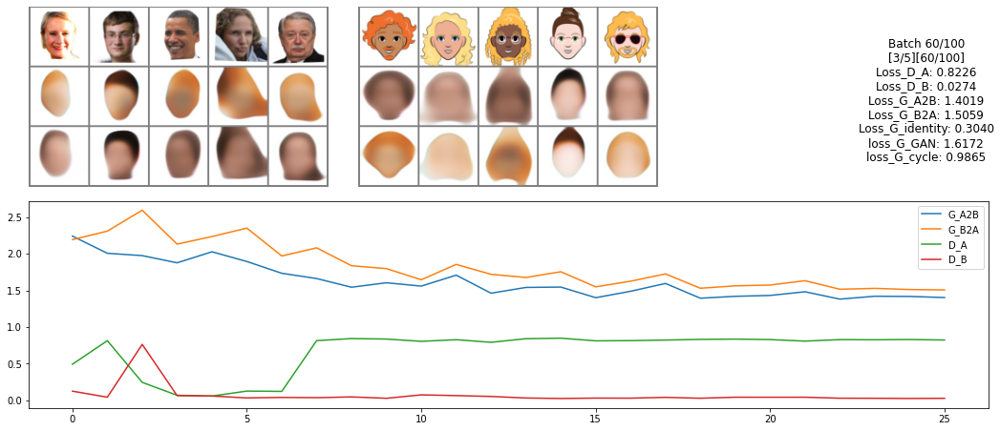

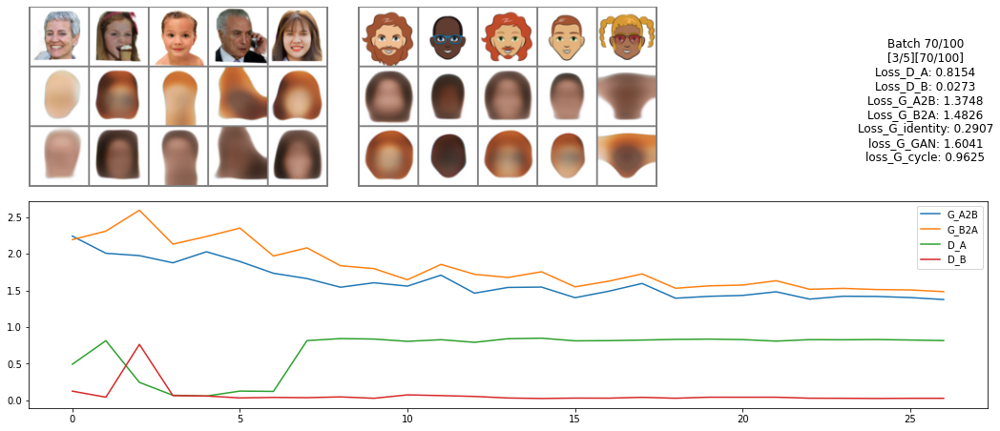

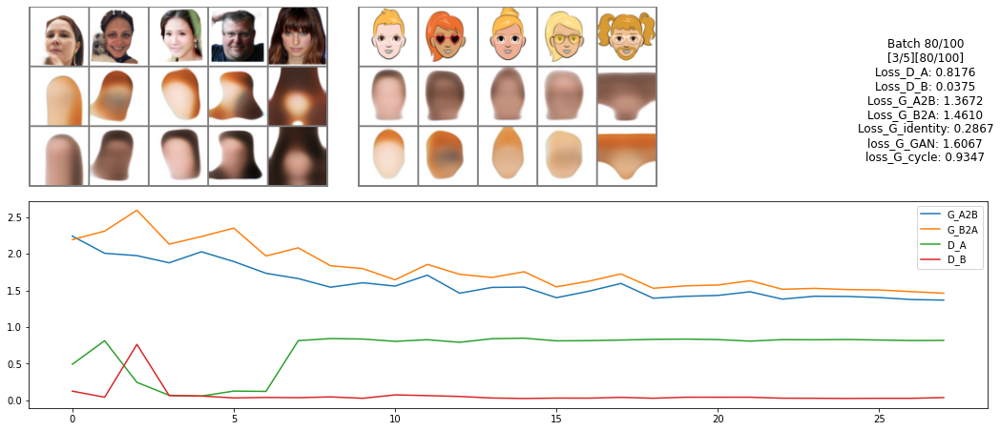

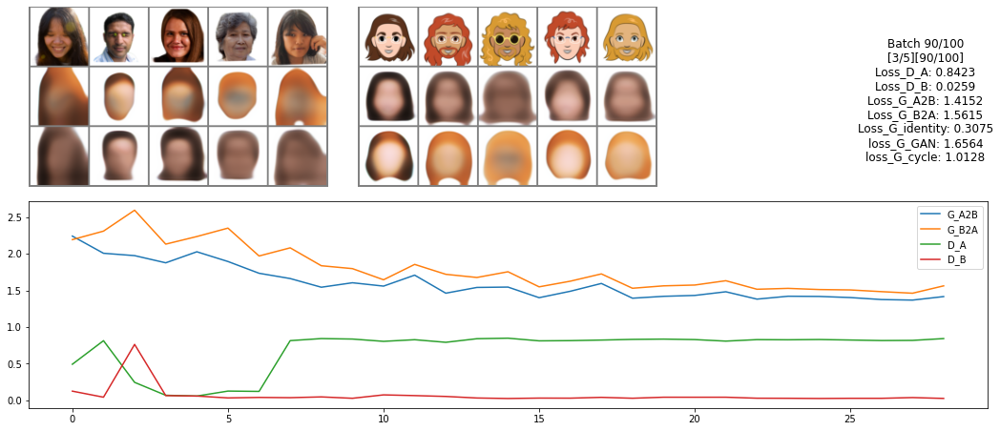

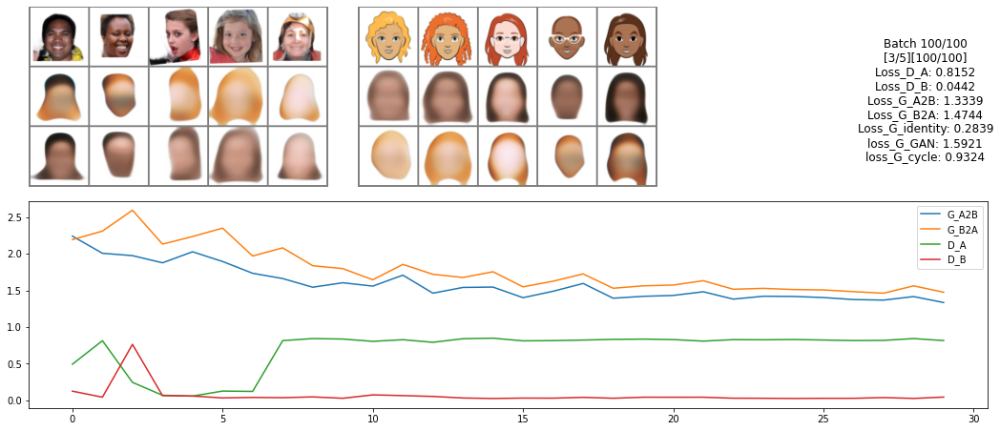

  0%|          | 0/100 [00:00<?, ?it/s]

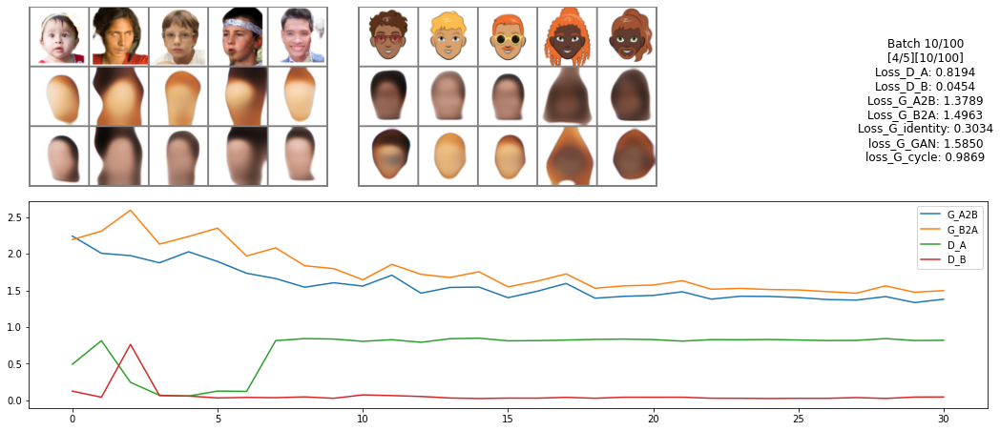

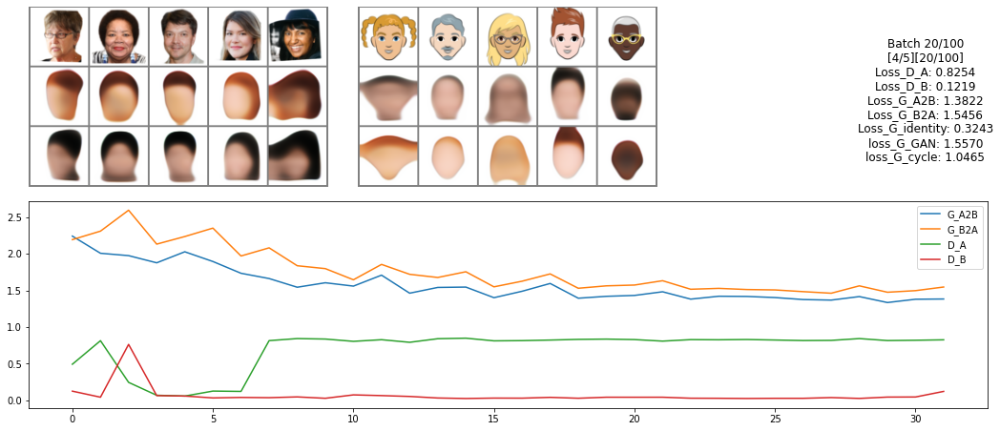

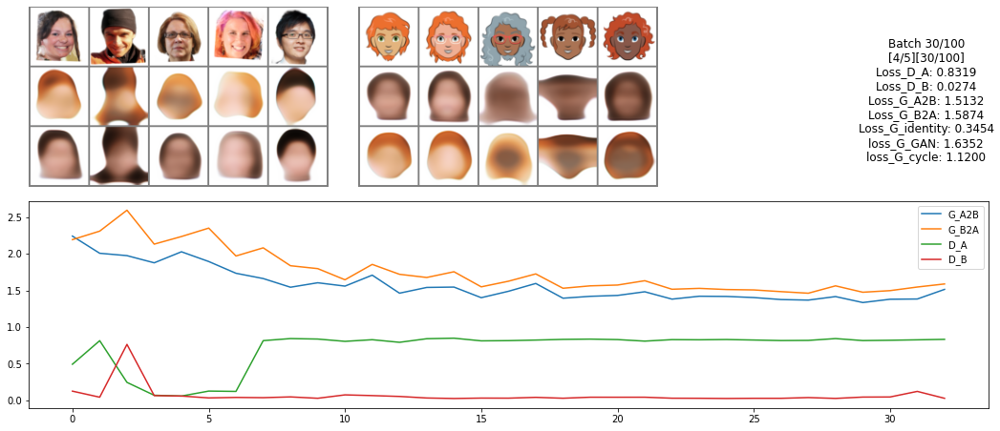

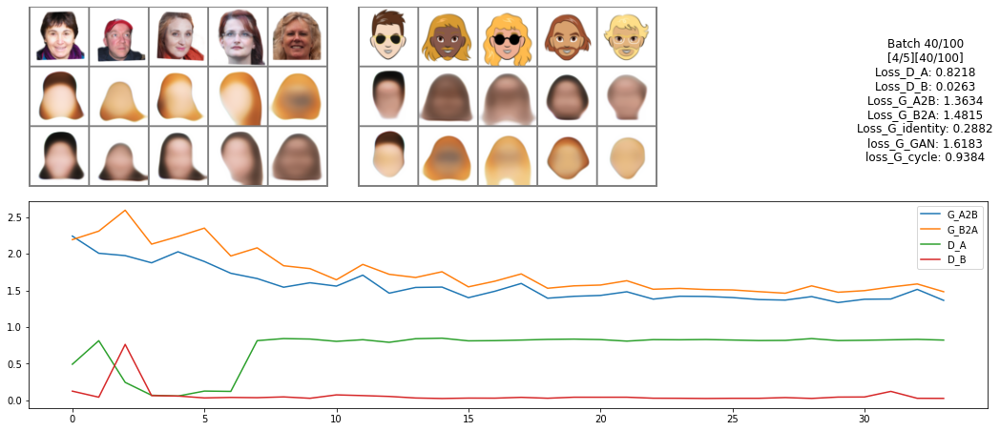

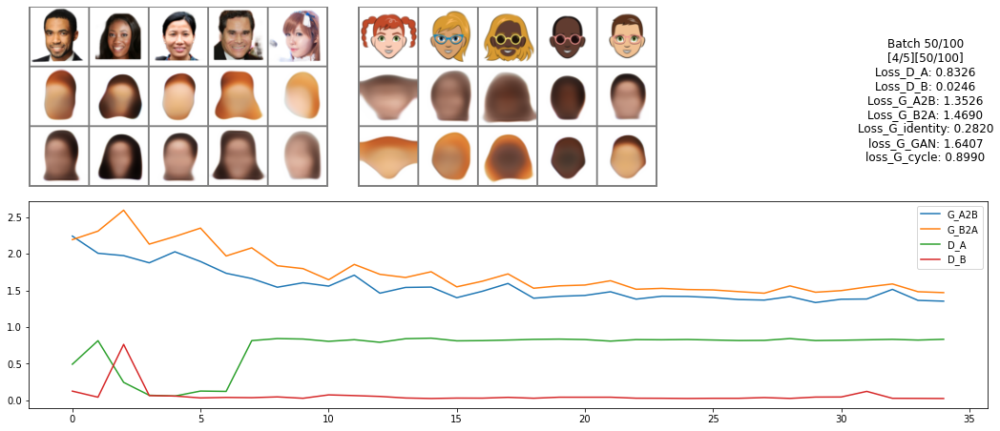

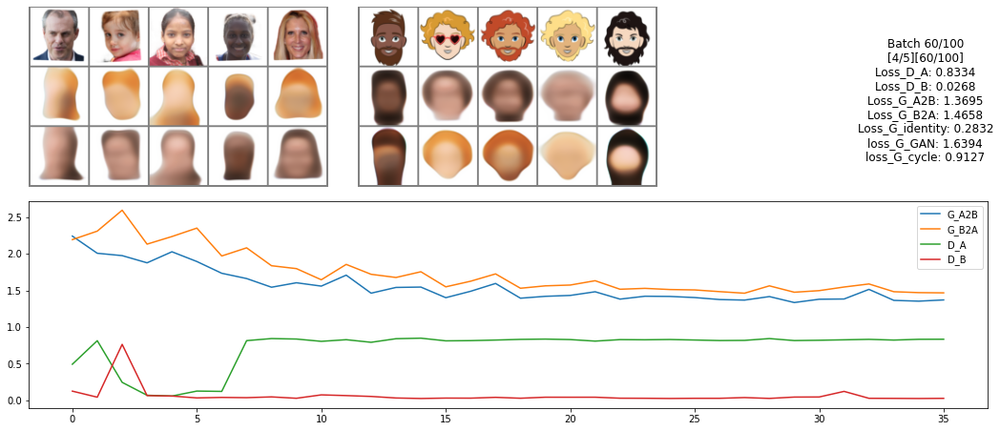

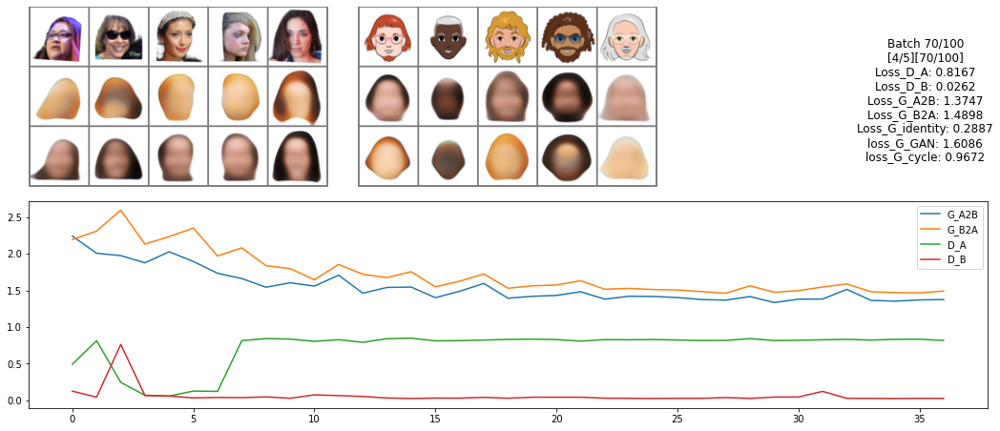

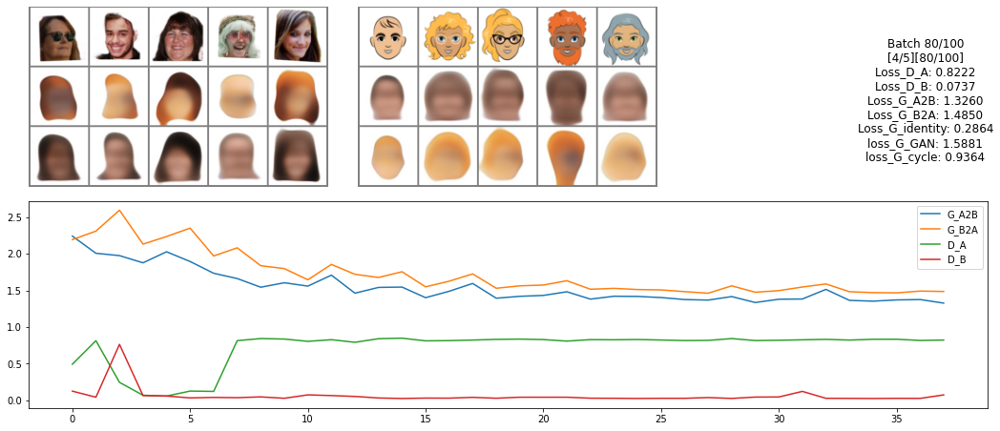

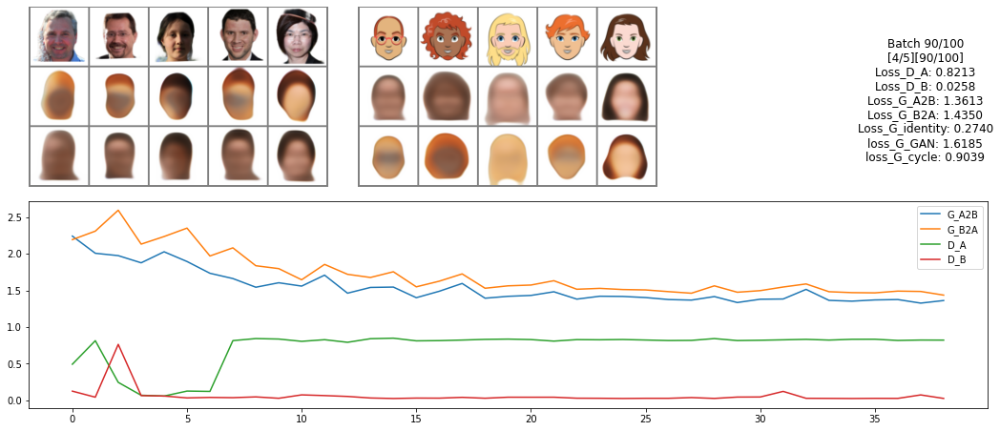

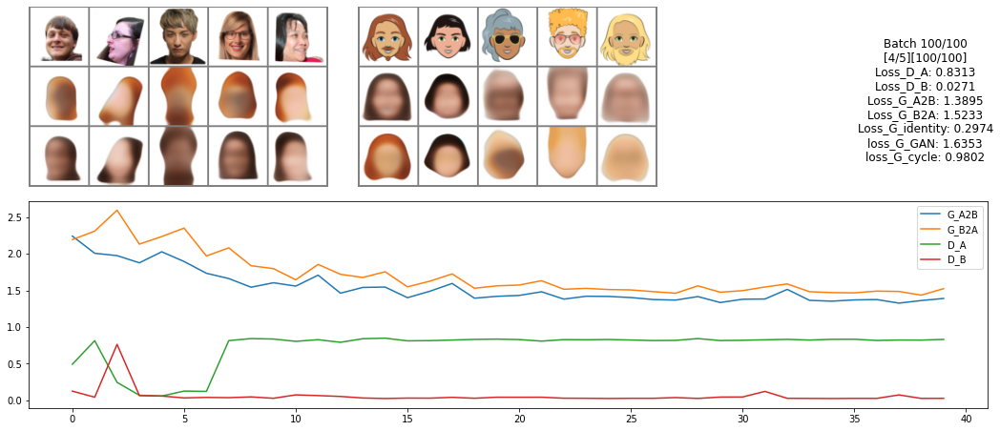

  0%|          | 0/100 [00:00<?, ?it/s]

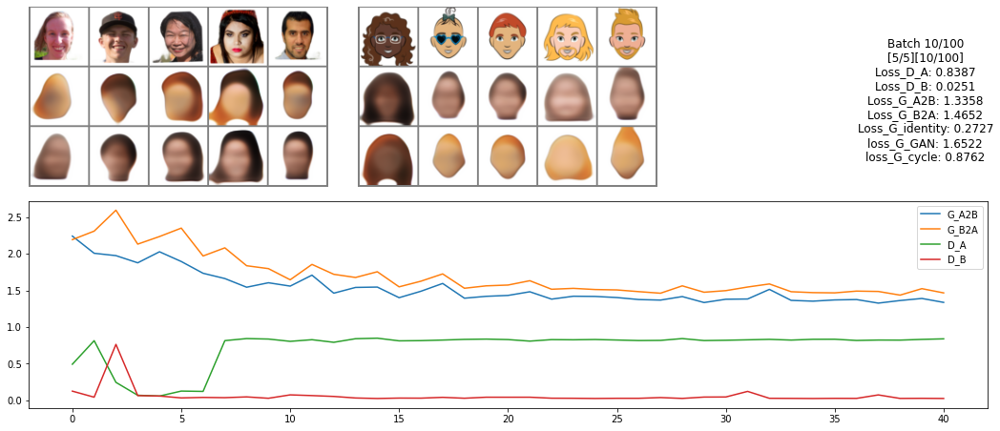

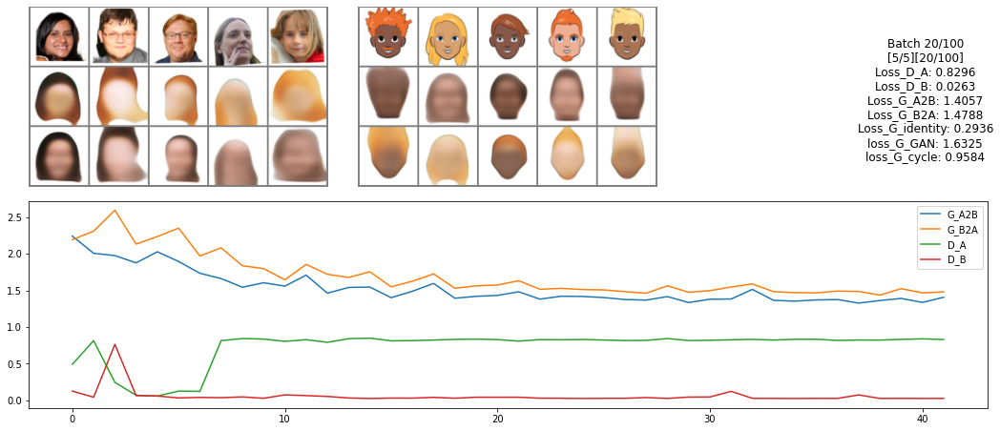

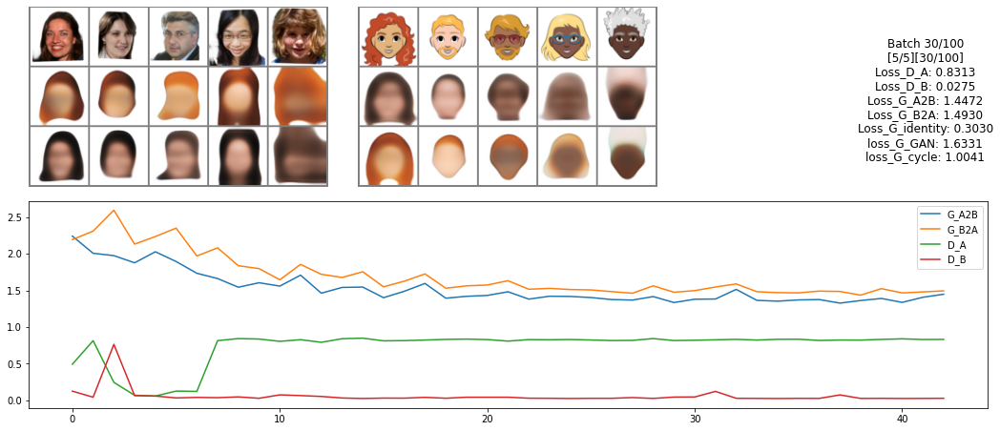

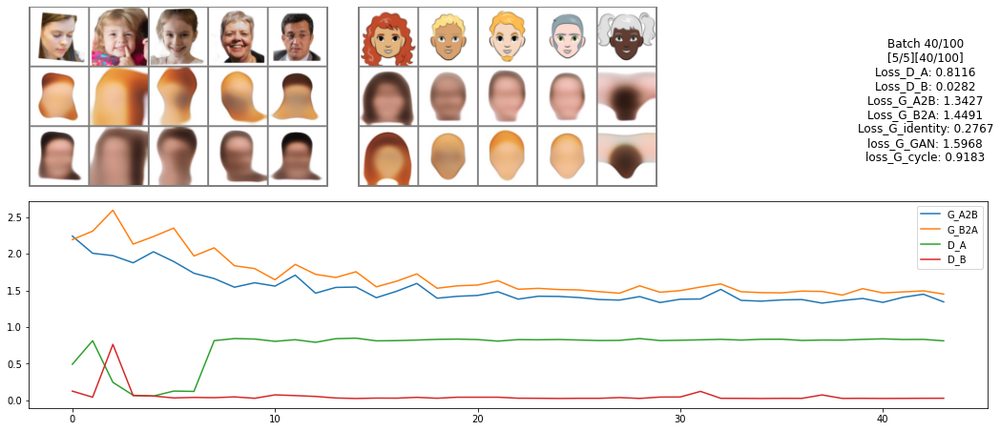

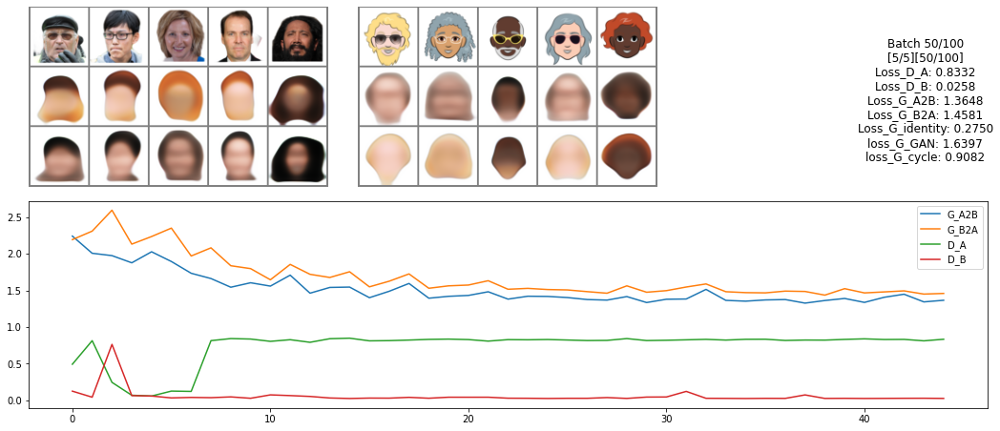

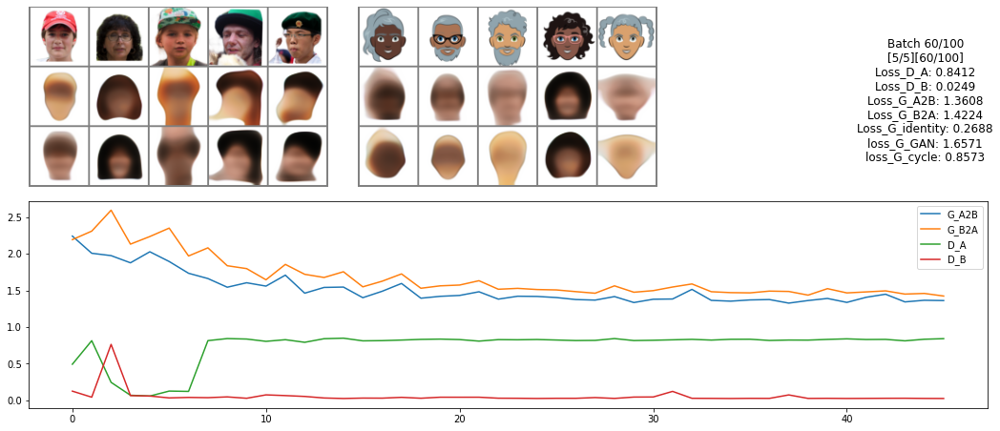

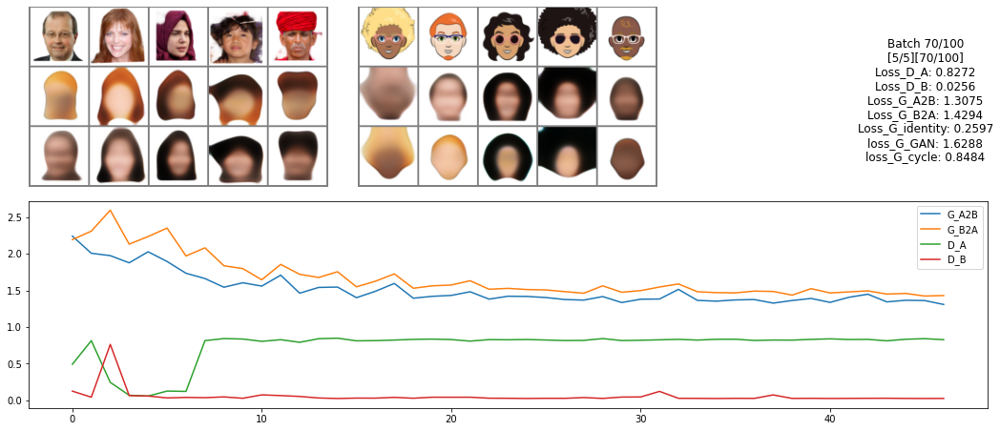

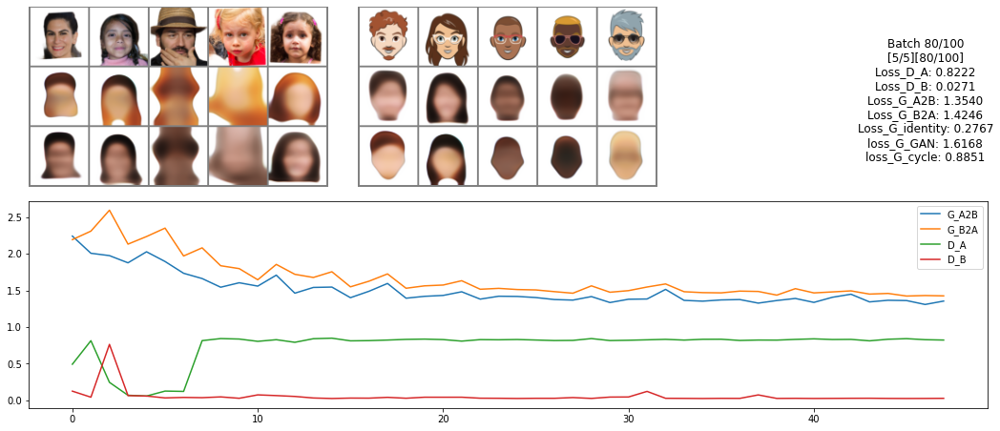

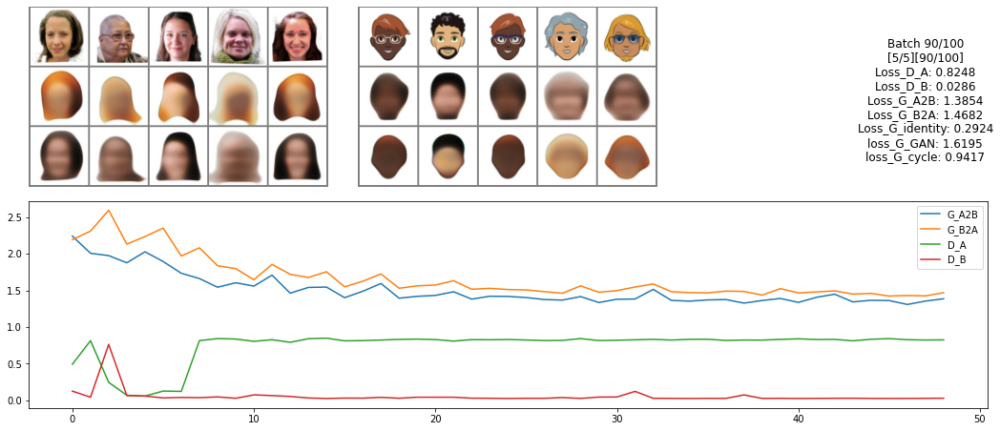

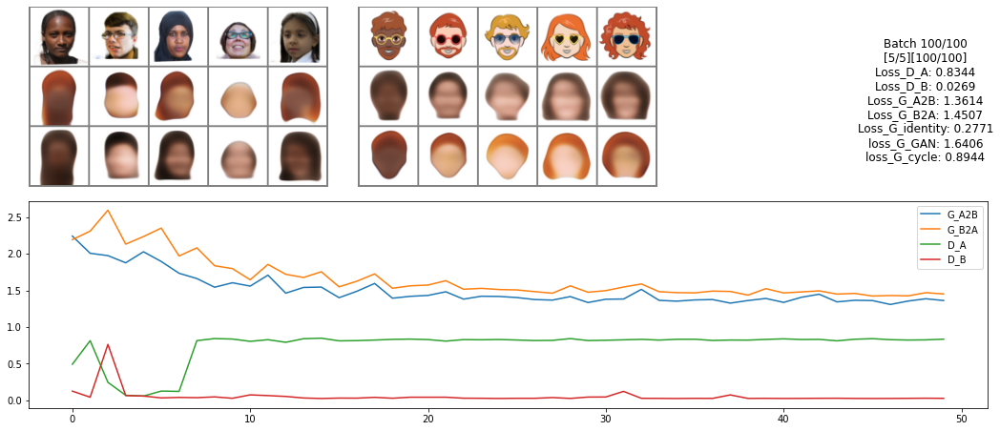

In [125]:
train(0, 5)

In [ ]:
torch.save(G_A2B.cpu().state_dict(), '/content/drive/MyDrive/DLS FINAL/11_02/17.15_' + 'G_A2B')
torch.save(G_B2A.cpu().state_dict(), '/content/drive/MyDrive/DLS FINAL/11_02/17.15_' + 'G_B2A')
torch.save(D_A.cpu().state_dict(), '/content/drive/MyDrive/DLS FINAL/11_02/17.15_' + 'D_A')
torch.save(D_B.cpu().state_dict(), '/content/drive/MyDrive/DLS FINAL/11_02/17.15_' + 'D_B')
G_A2B.to(device)
G_B2A.to(device)
D_A.to(device)
D_B.to(device)